# Group velocity

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation

from JSAnimation import IPython_display

In [2]:
# Wave 1.
k1, w1 = 5., 5.
c1 = w1 / k1

# Wave 2.
k2, w2 = 3., 4.5
c2 = w2 / k2

cg = (w2 - w1) / (k2 - k1)
cgc = (w2 + w1) / (k2 + k1)

deltg = 10 if cg <= 0 else 10.

In [3]:
def basic_animation(frames=200, interval=30, dt=0.1):
    fig = plt.figure(figsize=(8, 3))
    ax = plt.axes(xlim=(-15, 15), ylim=(-2, 2))
    
    # Animated.
    kw0 = dict(color='k', linestyle=':', alpha=0.5)
    kw1 = dict(alpha=0.5, linestyle='none', marker='o')
    text = ax.text([], 0, 'Cg')
    line0, = ax.plot([], [], color='gray')
    line1, = ax.plot([], [], 'r')
    line2, = ax.plot([], [], 'g')
    line3, = ax.plot([], [], **kw0)
    line4, = ax.plot([], [], **kw0)
    point0, = ax.plot([], [], 'r', **kw1)
    point1, = ax.plot([], [], 'g', **kw1)
    point2, = ax.plot([], [], 'gray', **kw1)

    # Non-animated.
    x = np.arange(-15, 15, 0.05)
    ax.set_xlabel('Distance')
    ax.set_ylabel('Amplitude')
    
    def init():
        return line0, line1, line2, line3, line4, point0, point1, point2, text

    def animate(k):
        t = k * dt
        eta1 = np.cos(k1 * x - w1 * t)
        eta2 = np.cos(k2 * x - w2 * t)
        etag = 2 * np.cos((k2 - k1) * x / 2. - (w2 - w1) * t / 2.)
        
        line0.set_data(x, eta1 + eta2)
        line1.set_data(x, eta1)
        line2.set_data(x, eta2)
        line3.set_data(x, etag)
        line4.set_data(x, -etag)
        point0.set_data(t * c1 - 10, 0)
        point1.set_data(t * c2 - 10, 0)
        point2.set_data(t * cgc - 10, 0)
        text.set_x(t * cg - deltg)
        return line0, line1, line2, line3, line4, point0, point1, point2, text

    return animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=interval)

In [4]:
dt = 0.1  # Time step
frames = 120

nstep = 150  # Number of time steps to take.

ani = basic_animation(frames=frames, dt=dt)

ani.save('animation_group_velocity.gif', writer='imagemagick', fps=100)


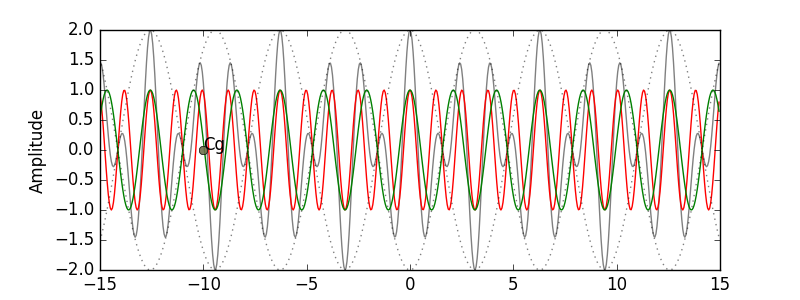
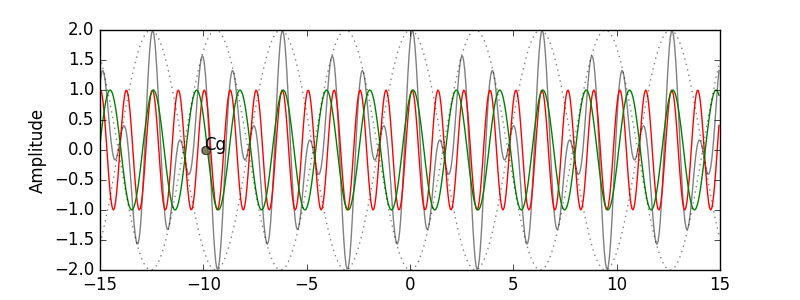
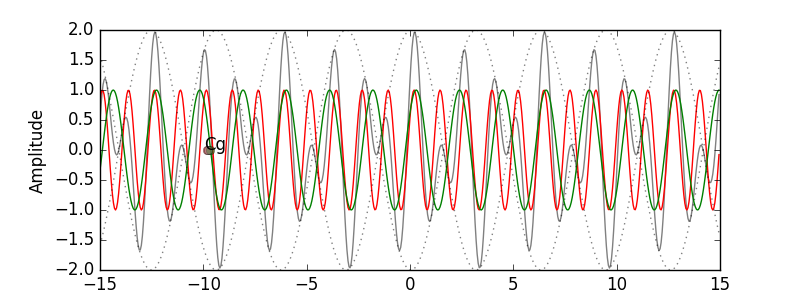
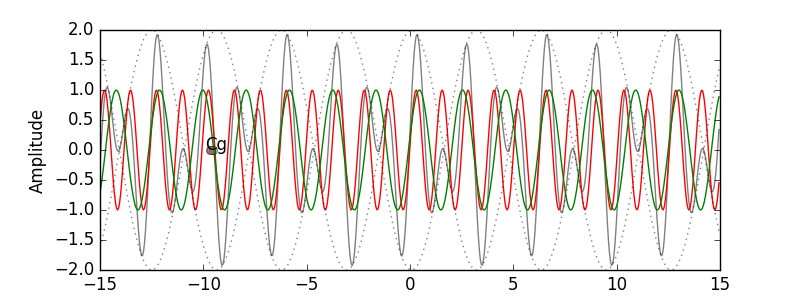
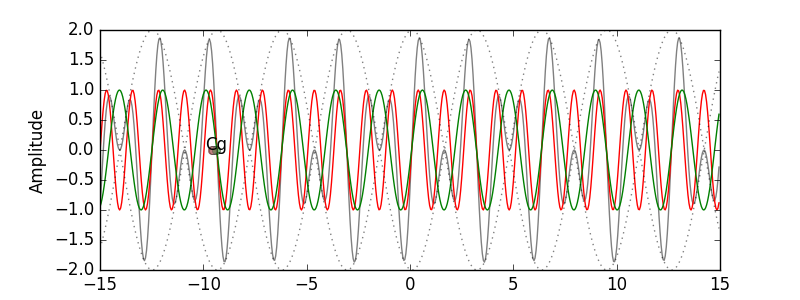
...
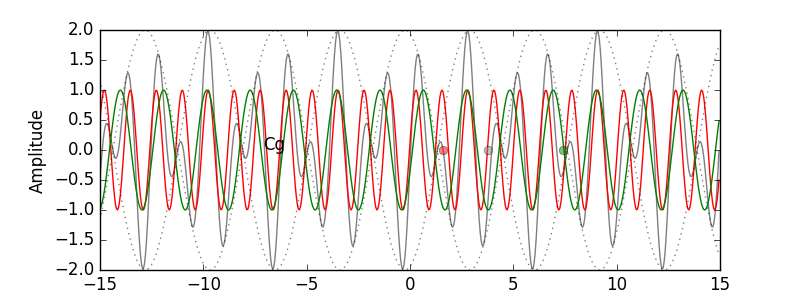
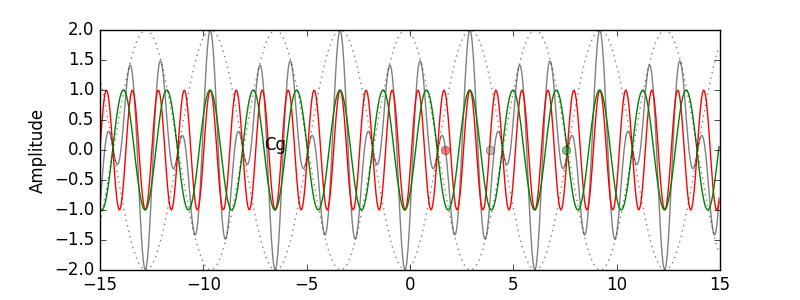
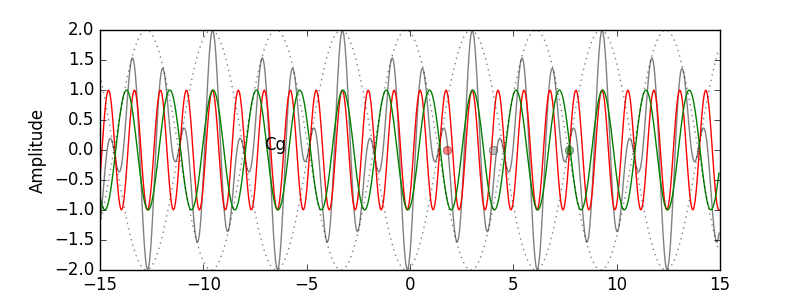
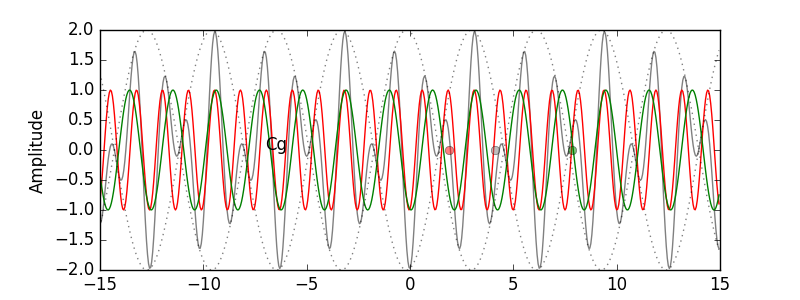
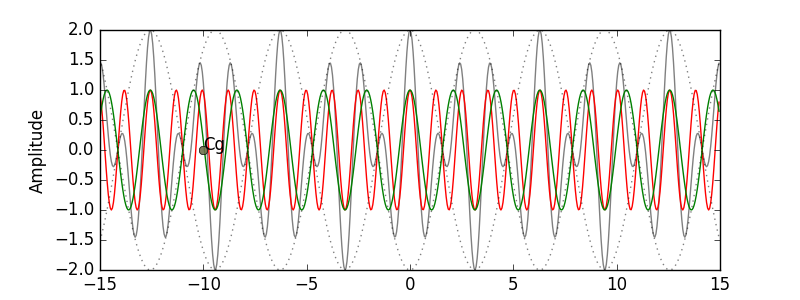

In [5]:
ani